# **Deep Learning (Foundations): Course Project**

## **Classifcation with BACH's dataset ( breast cancer histology images)**

**Group Registration**

|      |     Student Name           |        Student e-mail             | 
|---   |         ---                |                  ---              |
| 1    |      Ana Carolina Ottavi   |       20220541@novaims.unl.pt     | 
| 2    |      Leonardo Teles        |       20220615@novaims.unl.pt     | 
| 3    |      Carolina Bezerra      |       20220392@novaims.unl.pt     | 
| 4    |      Sabeen Mubashar       |       20220726@novaims.unl.pt     |
| 5    |      Maria Arbelaez        |       20221381@novaims.unl.pt     | 

**Data Source**

Note that the original data was not organized in trainning and test folders, therefore we performed this organization ourselves. The dataset contained 400 images (100 images per class) and we decided to put 40 images in the test folder (10 images per class) and leave the remaining 360 images for trainning.

Original data: BACH dataset. (2019). CC BY-NC-ND. Retrieved from https://drive.google.com/file/d/1_HWnQT3UN9iAQEjMc9xP-dIxfOwVx7Fb/view?usp=share_link linked in https://github.com/bupt-ai-cz/BreastCancerCNN

Guilherme Aresta, Teresa Araújo, Scotty Kwok, Sai Saketh Chennamsetty, Mohammed Safwan, Varghese Alex, Bahram Marami, Marcel Prastawa, Monica Chan, Michael Donovan, Gerardo Fernandez, Jack Zeineh, Matthias Kohl, Christoph Walz, Florian Ludwig, Stefan Braunewell, Maximilian Baust, Quoc Dang Vu, Minh Nguyen Nhat To, Eal Kim, Jin Tae Kwak, Sameh Galal, Veronica Sanchez-Freire, Nadia Brancati, Maria Frucci, Daniel Riccio, Yaqi Wang, Lingling Sun, Kaiqiang Ma, Jiannan Fang, Ismael Kone, Lahsen Boulmane, Aurélio Campilho, Catarina Eloy, António Polónia, Paulo Aguiar,

BACH: Grand challenge on breast cancer histology images,
Medical Image Analysis,
Volume 56,
2019,
Pages 122-139,
ISSN 1361-8415,

https://doi.org/10.1016/j.media.2019.05.010.

(https://www.sciencedirect.com/science/article/pii/S1361841518307941)

**Dataset Description**

Microscopy images are labelled as normal, benign, in situ carcinoma or invasive carcinoma according to the predominant cancer type in each image. The annotation was performed by two medical experts and images where there was disagreement were discarded.

The dataset contains a total of 400 microscopy images, distributed as follows:
- Normal: 100
- Benign: 100
- in situ carcinoma: 100
- Invasive carcinoma: 100

Microscopy images are on .tiff format and have the following specifications:
- Color model: R(ed)G(reen)B(lue)
- Size: 2048 x 1536 pixels
- Pixel scale: 0.42 µm x 0.42 µm
- Memory space: 10-20 MB (approx.)
- Type of label: image-wise

# **Summary of Main Steps and Findings in Exploration**

- For the exploration of the dataset the following steps where taken:...... 
- The main findigs where:
 - The dataset only contains 400 images, hence data augmentation will be key to achieve a better performance of the model and prevent overfitting. 
 - The dataset is balanced, containing the same number of samples per class.
 - The images file extention is .tif which is not supported by keras, therefore it will be converted to .png. 
 - The color mode of the images is RGB.
 - The size of the images is quite large (2048 x 1536 pixels), therefore resizing will be required in the preprocessing for the sake of computational resources.
 - All images are of the same size and aspect ratio, thus no cropping will be needed.
 - .........






# **Summary of Main Steps and Findings in Preprocessing**

- For the preprocessing of the dataset the following steps where taken:......
- The main findings where:
 - ......


# **Importing Libraries**

In [ ]:
import tensorflow as tf
from tensorflow.keras import datasets
from tensorflow.keras.preprocessing import image_dataset_from_directory, image
from tensorflow.keras import Sequential, layers, initializers, regularizers, optimizers, metrics 

import os
import time
import shutil
import random 
import zipfile
import cv2 # image processing library used to convert the .tif images to a supported format .png

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.colors import ListedColormap

from sklearn.decomposition import PCA
from math import ceil

In [ ]:
device_name = tf.test.gpu_device_name()
if len(device_name) > 0:
    print("Found GPU at: {}".format(device_name))
else:
    device_name = "/device:CPU:0"
    print("No GPU, using {}.".format(device_name))

Found GPU at: /device:GPU:0


# **Loading Images**

Set the connection to the data source, unzip images and convert them to supported format .png (currently they are in .tif format).

In [ ]:
# Set the machine
gdrive = True
# Set the connection string
path = "/content/drive/MyDrive/DL-PROJECT/"
main_folder, training_folder, testing_folder = "breast_cancerV2/", "training_set/", "test_set/"

# If using Google Drive
if gdrive:
    # Setup drive
    from google.colab import drive
    drive.mount('/content/drive')        
    # Transfer zip dataset to the current virtual machine
    t0 = time.time()
    shutil.copyfile(path + 'breast_cancerV2.zip', 'breast_cancerV2.zip')
    # Extract files and convert images to png format
    with zipfile.ZipFile('breast_cancerV2.zip', 'r') as zip_ref:
        zip_ref.extractall()

    for class_name in os.listdir(main_folder + training_folder):
        class_folder = main_folder + training_folder + class_name
        for filename in os.listdir(class_folder):
            if filename.endswith('.tif'):
                img = cv2.imread(os.path.join(class_folder, filename))
                output_file = os.path.join(class_folder, filename.replace('.tif', '.png'))
                cv2.imwrite(output_file, img)
                os.remove(os.path.join(class_folder, filename))

    for class_name in os.listdir(main_folder + testing_folder):
        class_folder = main_folder + testing_folder + class_name
        for filename in os.listdir(class_folder):
            if filename.endswith('.tif'):
                img = cv2.imread(os.path.join(class_folder, filename))
                output_file = os.path.join(class_folder, filename.replace('.tif', '.png'))
                cv2.imwrite(output_file, img)
                os.remove(os.path.join(class_folder, filename))

    print("File transfer and conversion completed in %0.3f seconds" % (time.time() - t0))
    path = ""

Mounted at /content/drive
File transfer and conversion completed in 213.502 seconds


# **1. Data Exploration**

### Looking at a randomly sampled images from each class

### Normal

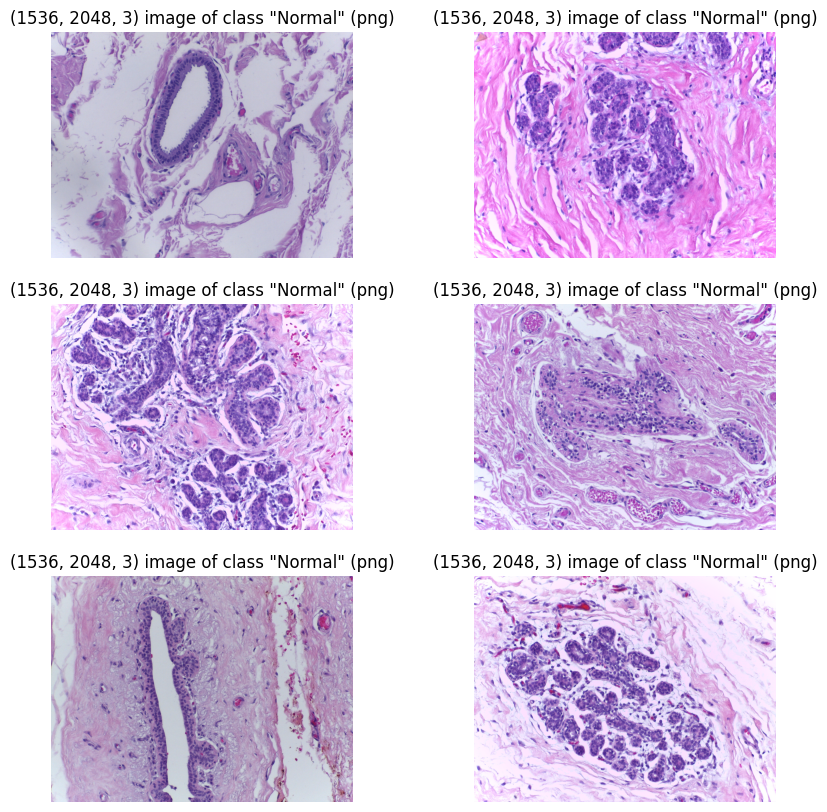

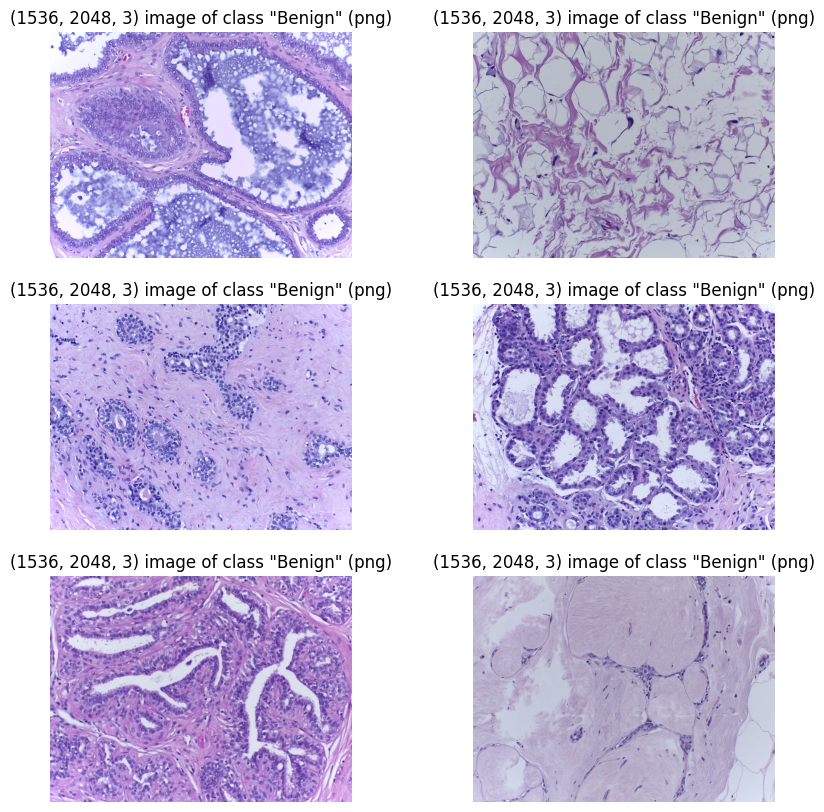

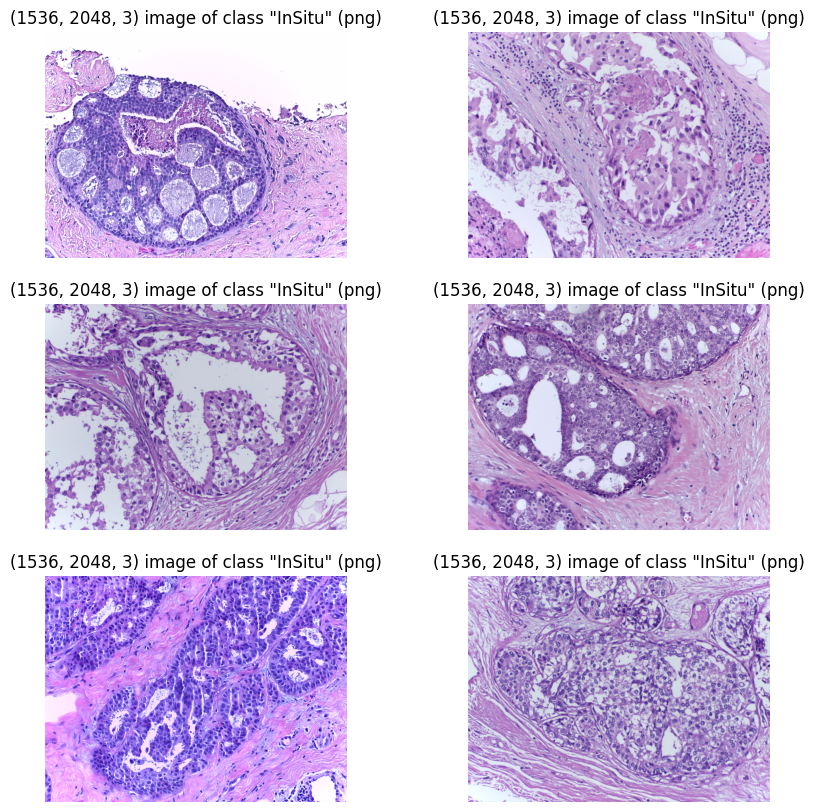

In [ ]:
def show_sample_images(folder_directory, class_):
    # Build a connection string
    full_path = folder_directory + class_ + "/"
    # Get a set of random images
    images = random.sample(os.listdir(full_path), 6)
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images):
        extension = img.split('.')[-1]
        img = mpimg.imread(full_path + img)
        ax = plt.subplot(3, 2,  i + 1)
        plt.imshow(img)
        plt.title("{} image of class \"{}\" ({})".format(img.shape, class_, extension))
        plt.axis("off")

show_sample_images(path + main_folder + training_folder, "Normal")
show_sample_images(path + main_folder + training_folder, "Benign")
show_sample_images(path + main_folder + training_folder, "InSitu")

### Benign

In [ ]:
def show_sample_images(folder_directory, class_):
    # Build a connection string
    full_path = folder_directory + class_ + "/"
    # Get a set of random images
    images = random.sample(os.listdir(full_path), 6)
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images):
        extension = img.split('.')[-1]
        img = mpimg.imread(full_path + img)
        ax = plt.subplot(3, 2,  i + 1)
        plt.imshow(img)
        plt.title("{} image of class \"{}\" ({})".format(img.shape, class_, extension))
        plt.axis("off")



### InSitu

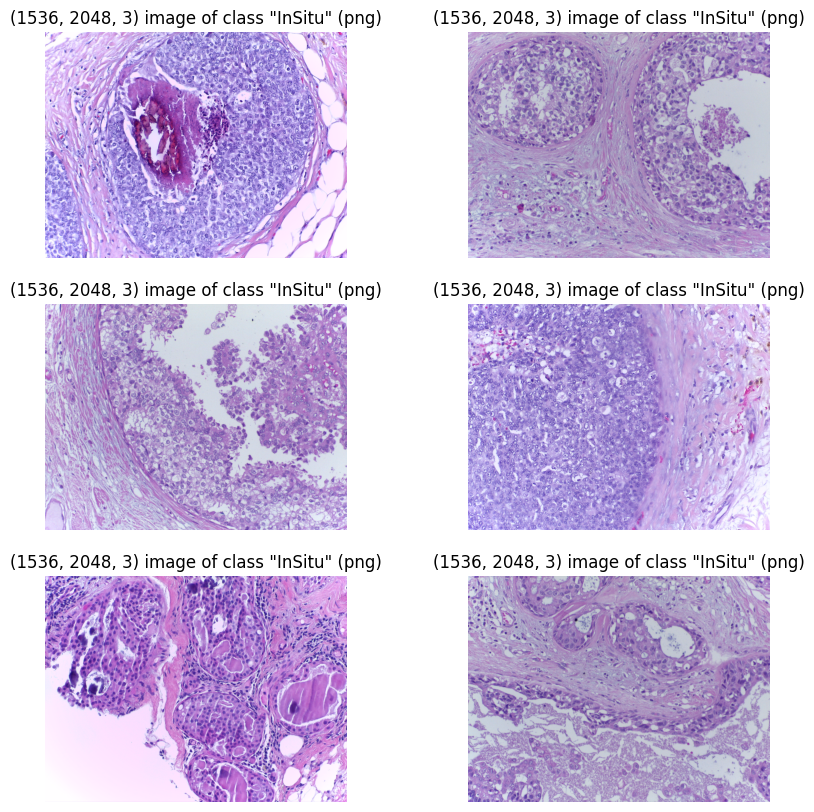

In [ ]:
def show_sample_images(folder_directory, class_):
    # Build a connection string
    full_path = folder_directory + class_ + "/"
    # Get a set of random images
    images = random.sample(os.listdir(full_path), 6)
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images):
        extension = img.split('.')[-1]
        img = mpimg.imread(full_path + img)
        ax = plt.subplot(3, 2,  i + 1)
        plt.imshow(img)
        plt.title("{} image of class \"{}\" ({})".format(img.shape, class_, extension))
        plt.axis("off")

show_sample_images(path + main_folder + training_folder, "InSitu")

### Invasive

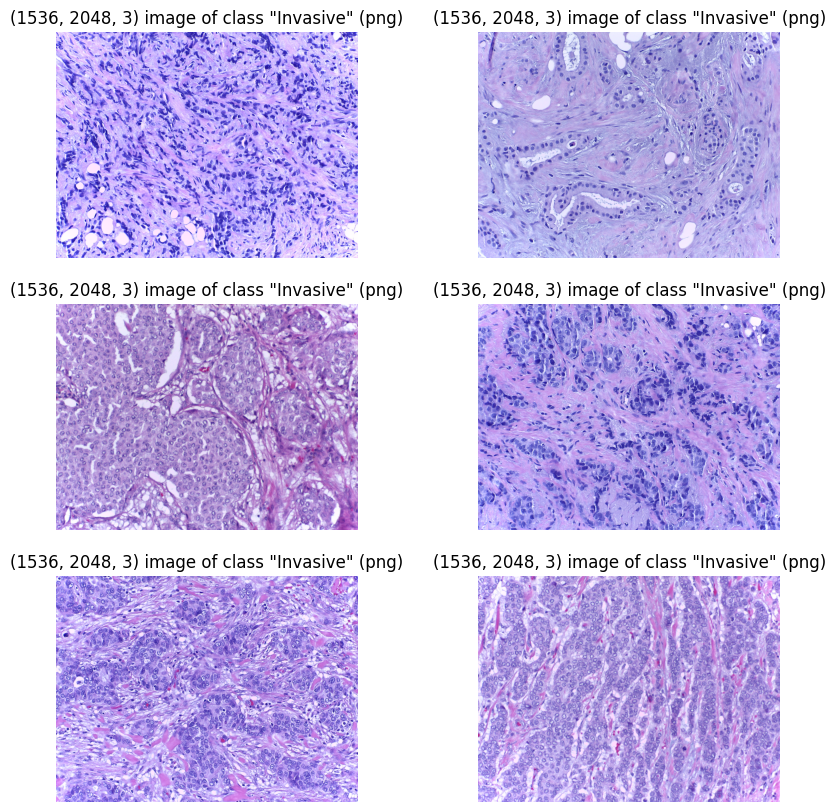

In [ ]:
def show_sample_images(folder_directory, class_):
    # Build a connection string
    full_path = folder_directory + class_ + "/"
    # Get a set of random images
    images = random.sample(os.listdir(full_path), 6)
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images):
        extension = img.split('.')[-1]
        img = mpimg.imread(full_path + img)
        ax = plt.subplot(3, 2,  i + 1)
        plt.imshow(img)
        plt.title("{} image of class \"{}\" ({})".format(img.shape, class_, extension))
        plt.axis("off")

show_sample_images(path + main_folder + training_folder, "Invasive")

### Inspecting classes' balance

In [ ]:
for split in [training_folder, testing_folder]:
    for c in ["Normal", "Benign", "InSitu", "Invasive"]:
        n_train_c = len(os.listdir(path + main_folder + split + f"/{c}"))
        print(f"Nº of instances of class {c} in the {split}: {n_train_c}")

Nº of instances of class Normal in the training_set/: 90
Nº of instances of class Benign in the training_set/: 90
Nº of instances of class InSitu in the training_set/: 90
Nº of instances of class Invasive in the training_set/: 90
Nº of instances of class Normal in the test_set/: 10
Nº of instances of class Benign in the test_set/: 10
Nº of instances of class InSitu in the test_set/: 10
Nº of instances of class Invasive in the test_set/: 10


### Other Explorations:

Converting images into a Numpy array to perform operations on them.
The following function will iterate through each class folder and turn them into an (n, m) matrix, where n is the number of observations and m is the number of pixels.

Source: https://gist.github.com/stereopickle/61d258aa46cab7b913fc17968523e070#file-pneumonia_npcovert-py

In [ ]:
# making n X m matrix
def img2np(path, list_of_filename, size = (256, 256, 3)):
    # iterating through each file
    for fn in list_of_filename:
        fp = path + fn
        current_image = image.load_img(fp, target_size = size, 
                                       color_mode = 'rgb')
        # covert image to a matrix
        img_ts = image.img_to_array(current_image)
        # turn that into a vector / 1D array
        img_ts = [img_ts.ravel()]
        try:
            # concatenate different images
            full_mat = np.concatenate((full_mat, img_ts))
        except UnboundLocalError: 
            # if not assigned yet, assign one
            full_mat = img_ts
    return full_mat

# run it on our folders

train_dir = path + main_folder + training_folder

# get the list of pngs from sub image class folders
normal_imgs = [fn for fn in os.listdir(f'{train_dir}/Normal') if fn.endswith('.png')]
benign_imgs = [fn for fn in os.listdir(f'{train_dir}/Benign') if fn.endswith('.png')]
insitu_imgs = [fn for fn in os.listdir(f'{train_dir}/InSitu') if fn.endswith('.png')]
invasive_imgs = [fn for fn in os.listdir(f'{train_dir}/Invasive') if fn.endswith('.png')]

normal_images = img2np(f'{train_dir}/Normal/', normal_imgs)
benign_images = img2np(f'{train_dir}/Benign/', benign_imgs)
insitu_images = img2np(f'{train_dir}/InSitu/', insitu_imgs)
invasive_images = img2np(f'{train_dir}/Invasive/', invasive_imgs)

#### Average Image

Seeing what the average image looks like for each class. 
To compute the average image, we take the average value of each pixel across all observations.

Source: https://gist.github.com/stereopickle/1bce78bcd925f89ef4e33070cfb7e43d#file-pneumonia_mean-py

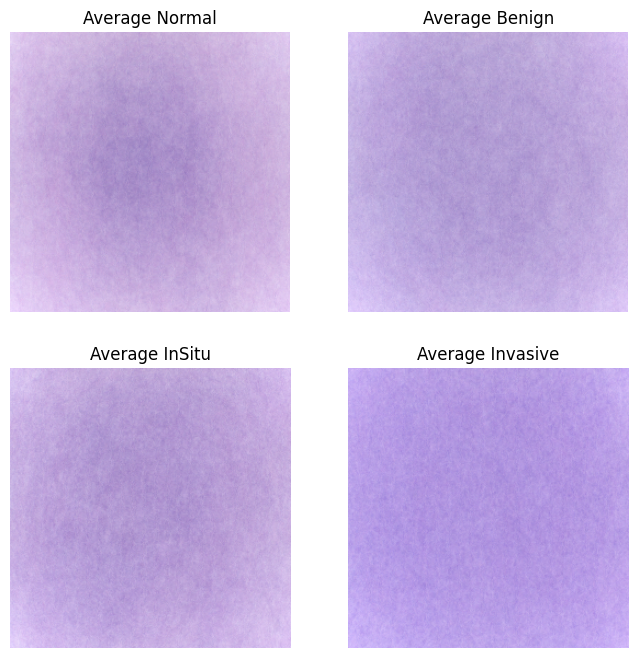

In [ ]:
def find_mean_img(full_mat, title, size = (256, 256, 3)):
    # calculate the average
    mean_img = np.mean(full_mat, axis = 0)
    # reshape it back to a matrix
    mean_img = mean_img.reshape(size)
    # normalize the image data
    mean_img /= np.max(mean_img)
    return mean_img

# calculate mean images for each class
norm_mean = find_mean_img(normal_images, 'Normal')
benign_mean = find_mean_img(benign_images, 'Benign')
insitu_mean = find_mean_img(insitu_images, 'InSitu')
invasive_mean = find_mean_img(invasive_images, 'Invasive')

# plot mean images using subplots
fig, axs = plt.subplots(2, 2, figsize=(8, 8))
axs[0, 0].imshow(norm_mean, vmin=0, vmax=1, cmap='viridis')
axs[0, 0].set_title('Average Normal')
axs[0, 1].imshow(benign_mean, vmin=0, vmax=1, cmap='viridis')
axs[0, 1].set_title('Average Benign')
axs[1, 0].imshow(insitu_mean, vmin=0, vmax=1, cmap='viridis')
axs[1, 0].set_title('Average InSitu')
axs[1, 1].imshow(invasive_mean, vmin=0, vmax=1, cmap='viridis')
axs[1, 1].set_title('Average Invasive')
for ax in axs.flat:
    ax.axis('off')
plt.show()

The resulting images show us that:
- Normal class images tend to have lower pixel values in the center of the image and higher pixel values in the suroundings.
- Benigns and InSitu classes images have a similar behavior, though the pixels in the center of the image seem to have higher values than the ones in Normal images and this "center" is also more spread out.
- Invasive class images seem to have almost the same pixel values all across the image.

#### Contrast Between Average Images

Source: https://gist.github.com/stereopickle/106dc02a7d72d237e8ad616dbf148d1e#file-pneumonia_contrast-py

Yellow represents lower values, while purple represents higher values. In the resulting images, yellow areas indicate a smaller difference between the normal and breast cancer tissues, while purple areas indicate a higher difference.

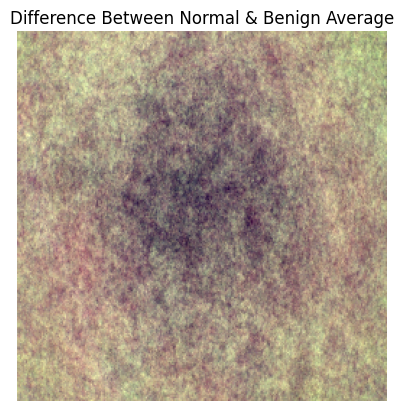

In [ ]:
contrast_mean = norm_mean - benign_mean
contrast_mean_scaled = (contrast_mean - contrast_mean.min()) / (contrast_mean.max() - contrast_mean.min())
plt.imshow(contrast_mean_scaled, cmap='viridis')
plt.title(f'Difference Between Normal & Benign Average')
plt.axis('off')
plt.show()

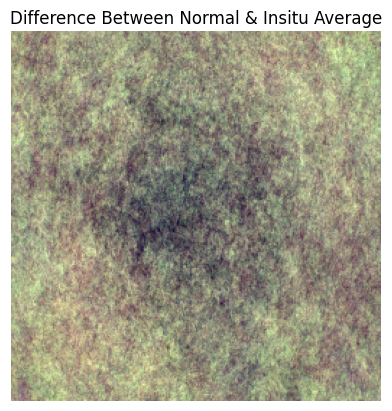

In [ ]:
contrast_mean = norm_mean - insitu_mean
contrast_mean_scaled = (contrast_mean - contrast_mean.min()) / (contrast_mean.max() - contrast_mean.min())
plt.imshow(contrast_mean_scaled, cmap='viridis')
plt.title(f'Difference Between Normal & Insitu Average')
plt.axis('off')
plt.show()

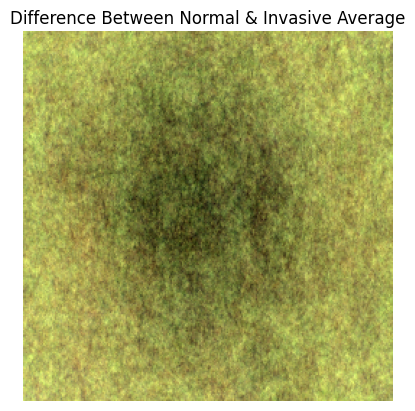

In [ ]:
contrast_mean = norm_mean - invasive_mean
contrast_mean_scaled = (contrast_mean - contrast_mean.min()) / (contrast_mean.max() - contrast_mean.min())
plt.imshow(contrast_mean_scaled, cmap='viridis')
plt.title(f'Difference Between Normal & Invasive Average')
plt.axis('off')
plt.show()

#### Eigenimages

"...we can use a dimension reduction technique such as the principal component analysis (PCA) to visualize the components that describe each class the best. The eigenimages, which is essentially the eigenvectors (components) of PCA of our image matrix, can be reshaped into a matrix and be plotted. It’s also called eigenfaces as this approach was first used for facial recognition research. Here we will visualize the principal components that describe 70% of variability for each class."

Source: https://towardsdatascience.com/exploratory-data-analysis-ideas-for-image-classification-d3fc6bbfb2d2

Number of PC:  36


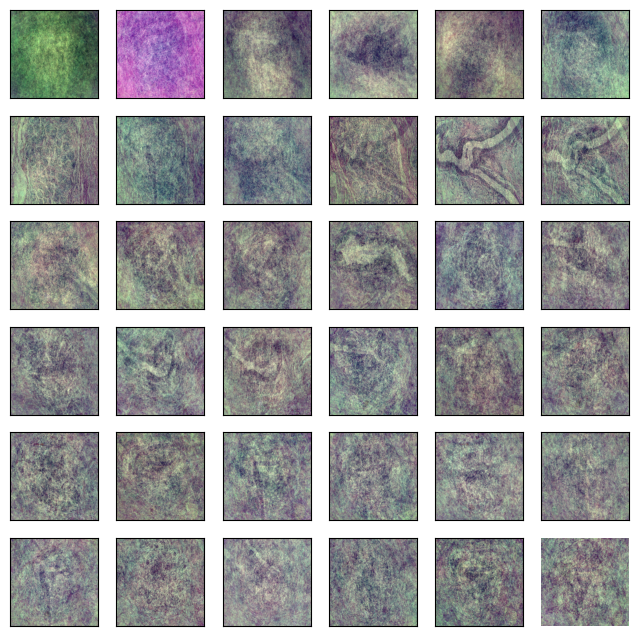

Number of PC:  43


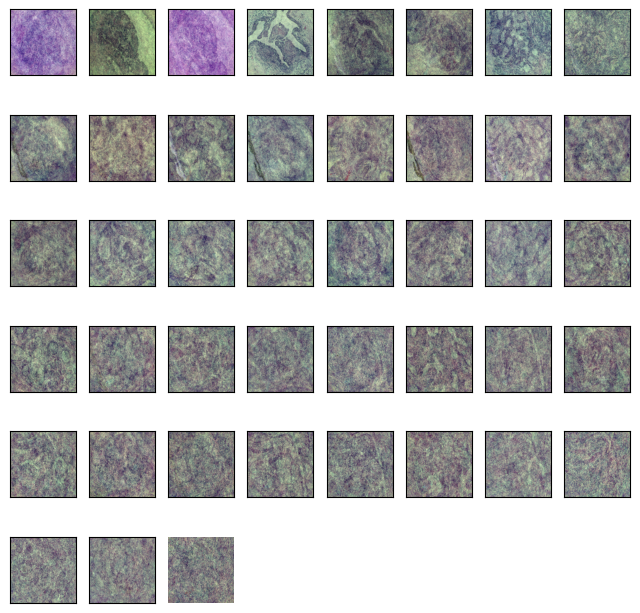

Number of PC:  42


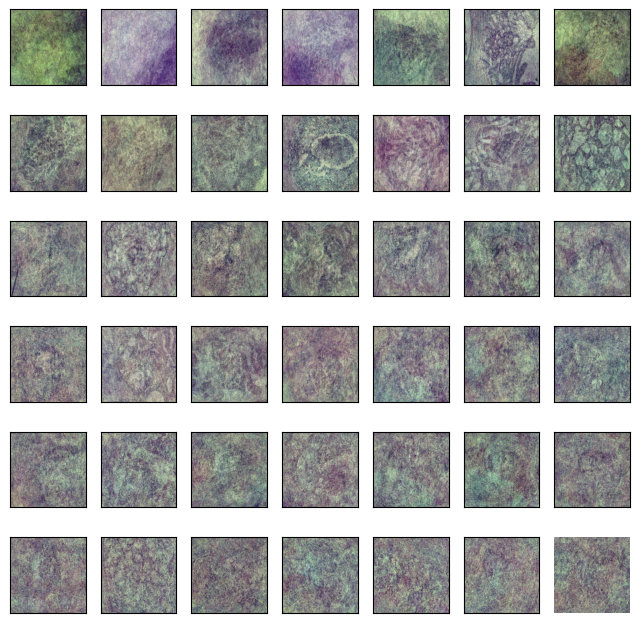

Number of PC:  44


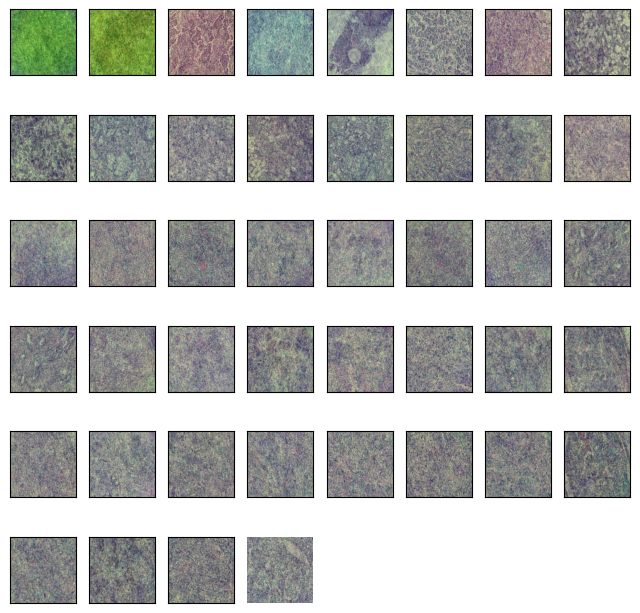

In [ ]:
# Source: https://gist.github.com/stereopickle/67b325e84020bb2d57f1a902403c41bb#file-pneumonia_eigenimages-py

def eigenimages(full_mat, title, n_comp = 0.7, size = (256, 256, 3)):
    # fit PCA to describe n_comp * variability in the class
    pca = PCA(n_components = n_comp, whiten = True)
    pca.fit(full_mat)
    print('Number of PC: ', pca.n_components_)
    return pca
  
def plot_pca(pca, size = (256, 256, 3)):
    # plot eigenimages in a grid
    n = pca.n_components_
    fig = plt.figure(figsize=(8, 8))
    r = int(n**.5)
    c = ceil(n/ r)
    for i in range(n):
        # normalize pixel values to be within [0, 1]
        eigenimage = (pca.components_[i] - pca.components_[i].min()) / (pca.components_[i].max() - pca.components_[i].min())
        ax = fig.add_subplot(r, c, i + 1, xticks = [], yticks = [])
        ax.imshow(eigenimage.reshape(size))
    plt.axis('off')
    plt.show()
    
plot_pca(eigenimages(normal_images, 'Normal'))
plot_pca(eigenimages(benign_images, 'Benign'))
plot_pca(eigenimages(insitu_images, 'InSitu'))
plot_pca(eigenimages(invasive_images, 'Invasive'))

Other things we can explore: 

You can use various metrics to quantitatively measure the image quality and noise in your dataset. For example, you can use metrics such as peak signal-to-noise ratio (PSNR), mean square error (MSE), or structural similarity index (SSIM) to measure the quality and similarity of your images.

https://scikit-image.org/docs/dev/api/skimage.metrics.html

# **2. Data Preprocessing**

### **Generating tf.data.Datasets from image files in the directory.**

We will be loading batches of data using image_dataset_from_directory(). Some preprocessing steps will be performed while loading the data such as image resizing and one hot encoding of the labels.

During this step, the batch size will also be defined.

Image Size: In general, the resolutions for training CNNs usually range between 64 × 64 and 256 × 256. Previous studies on the role of image resolution in chest radiographs show that image resolution impacts CNN performance [7]. In this study by Sabottke et al., it is shown that better model performance was achieved with lower input image resolutions. While this might seem paradoxical, a lower number of input variables or features is often desirable in applications of deep architectures. This is because lowering the number of parameters that need to be optimized reduces the risk of model overfitting [8].

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8700246/#:~:text=In%20general%2C%20the%20resolutions%20for,64%20and%20256%20%C3%97%20256.

Batch Size: In practical terms, to determine the optimum batch size, we recommend trying smaller batch sizes first(usually 32 or 64), also keeping in mind that small batch sizes require small learning rates.

https://www.sciencedirect.com/science/article/pii/S2405959519303455

One Hot Encoding of labels: by setting label_mode to "categorical" the function will return our labels as one-hot arrays, with a 1 in the correct class slot.

Defining a list of parameters for the image_dataset_from_directory.

In [ ]:
image_size=(256, 256) # try different sizes
crop_to_aspect_ratio=False # Since our images already have a fixed aspect ratio of 4:3, there is no need to crop them further.
color_mode='rgb'
batch_size=32 # try different batch sizes
label_mode="categorical"
validation_split=0.2
shuffle=True
seed=42

Loading the training data using the image_dataset_from_directory function. Performs an automatic split in training and validation data via validation_split.

In [ ]:
# Generate an object of type tf.data.Dataset 
ds_train, ds_val = image_dataset_from_directory(path + main_folder + training_folder, 
                                                image_size=image_size,
                                                crop_to_aspect_ratio=crop_to_aspect_ratio,
                                                color_mode=color_mode,
                                                batch_size=batch_size,
                                                label_mode=label_mode,
                                                subset='both', # Subset of the data to return. One of "training", "validation" or "both". Only used if validation_split is set. When subset="both", the utility returns a tuple of two datasets (the training and validation datasets respectively).
                                                validation_split=validation_split, 
                                                shuffle=shuffle,
                                                seed=seed)
# Check object properties
print("\nObject's type:\t", type(ds_train))
print("Is it a tf.data.Dataset?\t R:",isinstance(ds_train, tf.data.Dataset))
print("Classes:", ds_train.class_names)

Found 360 files belonging to 4 classes.
Using 288 files for training.
Using 72 files for validation.

Object's type:	 <class 'tensorflow.python.data.ops.batch_op._BatchDataset'>
Is it a tf.data.Dataset?	 R: True
Classes: ['Benign', 'InSitu', 'Invasive', 'Normal']


Loading the testing data using the image_dataset_from_directory() function.

In [ ]:
ds_test = image_dataset_from_directory(path + main_folder + testing_folder, 
                                       image_size=image_size,
                                       crop_to_aspect_ratio=crop_to_aspect_ratio,
                                       color_mode=color_mode,
                                       batch_size=batch_size,
                                       label_mode=label_mode,                                     
                                       shuffle=shuffle,
                                       seed=seed)

Found 40 files belonging to 4 classes.


Iterating over dataset's items, obtaining an iterator object from an instance of tf.data.Dataset

In [ ]:
iter_train = iter(ds_train)
batch_x_train, batch_y_train = iter_train.next()
print(batch_x_train.shape, batch_y_train.shape)
print("\nSample of x_train:", batch_x_train[0, 0:2, 0:2, 0])
print("\nSample of y_train:", batch_y_train[0:5])
print("Sample average of y_train:", tf.reduce_mean(batch_y_train))

(32, 256, 256, 3) (32, 4)

Sample of x_train: tf.Tensor(
[[195.5  194.25]
 [201.75 193.5 ]], shape=(2, 2), dtype=float32)

Sample of y_train: tf.Tensor(
[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]], shape=(5, 4), dtype=float32)
Sample average of y_train: tf.Tensor(0.25, shape=(), dtype=float32)


Plotting images loaded with BatchDataset.

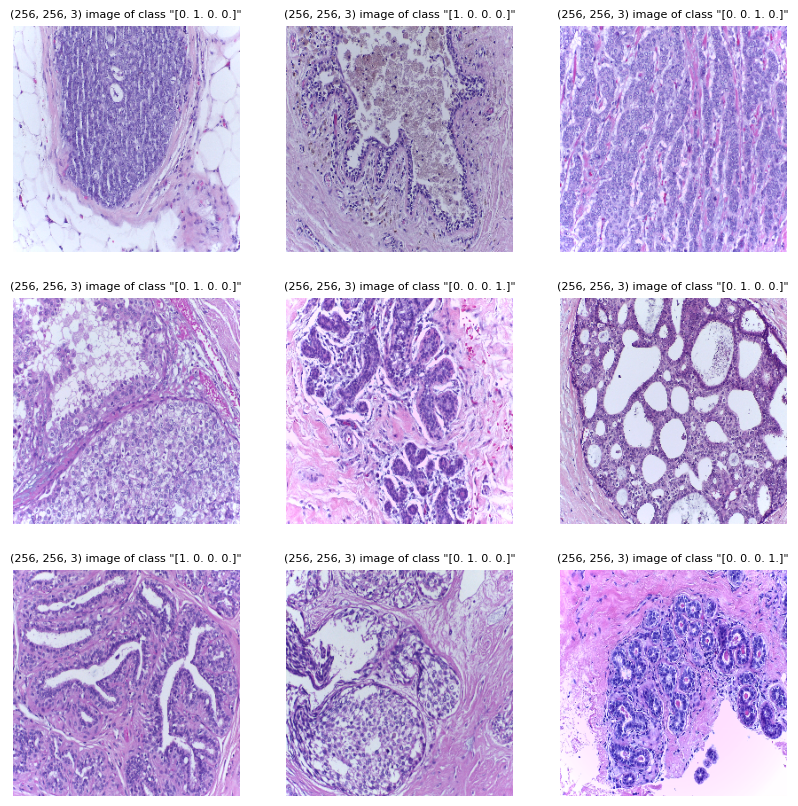

In [ ]:
def show_sample_batch(ds, grid_size=(3, 3)):
    n_images = grid_size[0]*grid_size[1]
    # Get a batch via iteration
    iter_ = iter(ds)
    batch_x, batch_y = iter_.next()
    batch_x, batch_y = batch_x[0:n_images], batch_y[0:n_images]
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, (img, y) in enumerate(zip(batch_x, batch_y)):
        ax = plt.subplot(grid_size[0], grid_size[1],  i + 1)
        plt.imshow(tf.cast(img, tf.int32))
        plt.title("{} image of class \"{}\"".format(img.shape, y), size=8)
        plt.axis("off")

show_sample_batch(ds_train)

### **Pixel Normalization**

The pixel values in tensors representing images must be scaled before flowing them into a DL model during the training or evaluation of the model. The cell below creates a preprocessing pipeline using a Sequential container. The pipeline performs image scaling down to [0, 1]. Given the fact image resizing is already performed by the image_dataset_from_directory() function, no resizing and cropping are required.

In [ ]:
preprocessing = Sequential([layers.Rescaling(1./255)], name="preprocessing")

This pipeline will be used when building the architecture of the models.

### **Data Augmentation**

Defining image augmentation pipeline.

In [ ]:
augmentation = Sequential([layers.RandomFlip(), 
                            layers.RandomRotation(factor=0.1, fill_mode='reflect'), 
                            layers.RandomZoom(height_factor=0.1, width_factor=0.1, fill_mode='reflect'),
                            layers.RandomContrast(factor=0.2),
                            layers.RandomBrightness(factor=0.2)], 
                           name="my_augmentation_pipeline")

This pipeline will be used when building the architecture of the models.

Checking how many new images are being created with augmentation

In [ ]:
import numpy as np

# Generate a batch of images
batch_size = 32
ds_train_batch = ds_train.take(1)

# Apply the data augmentation pipeline to the batch
augmented_images = []
for image, label in ds_train_batch:
    for i in range(batch_size):
        # Apply image augmentation to each image in the batch
        augmented_image = augmentation(image)
        augmented_images.append(augmented_image)

# Calculate the number of augmented images per batch
num_augmented_images = len(augmented_images)
num_original_images = batch_size
total_images_per_batch = num_augmented_images + num_original_images

print(f"Batch size: {batch_size}")
print(f"Number of original images per batch: {num_original_images}")
print(f"Number of augmented images per batch: {num_augmented_images}")
print(f"Total number of images per batch: {total_images_per_batch}")


Batch size: 32
Number of original images per batch: 32
Number of augmented images per batch: 32
Total number of images per batch: 64


Plotting batch of augmeted images

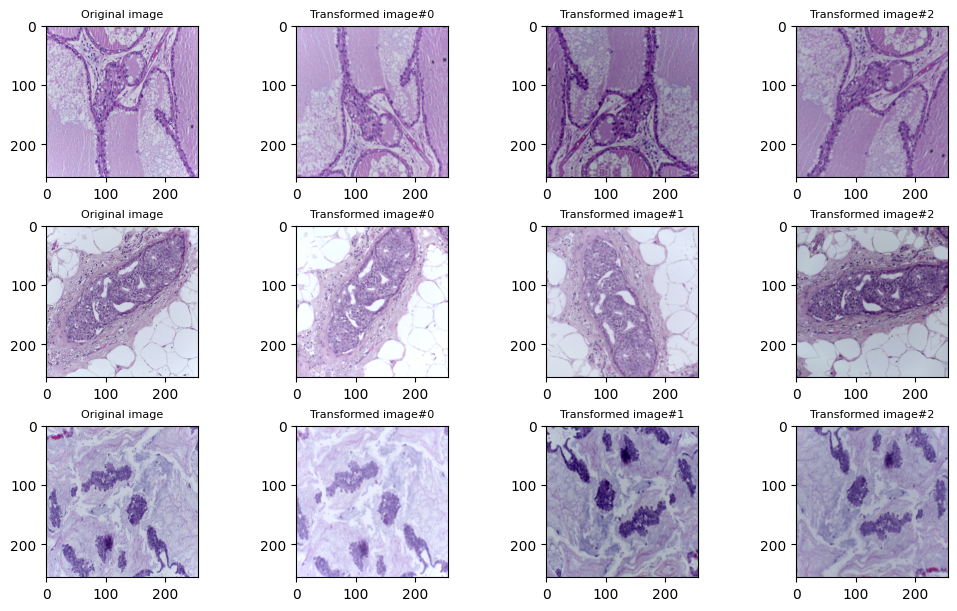

In [ ]:
def show_augmented_sample_batch(batch_x, augmentation_pipe, trials=3, fig_size=(10, 6)):
    # Plot the images
    _, axs = plt.subplots(len(batch_x), trials + 1, figsize=(10, 6), layout='constrained')
    for i, img in enumerate(batch_x):
        axs[i, 0].imshow(tf.cast(img, tf.int32))
        axs[i, 0].set_title("Original image", size=8)
        for t in range(trials):
            # Pass through the augmentation pipeline
            augmented_i = augmentation_pipe(img, training=True)
            axs[i, t+1].imshow(tf.cast(augmented_i, tf.int32))
            axs[i, t+1].set_title("Transformed image#{}".format(t), size=8)

show_augmented_sample_batch(batch_x_train[0:3], augmentation_pipe=augmentation)

#Transfer learning

In this project, we will be implementing and comparing two state-of-the-art deep learning models for image classification: InceptionV3 and ResNet50. These models have been widely used in various computer vision tasks and have achieved remarkable results.

We are following this paper:
https://arxiv.org/pdf/1802.09424.pdf

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Dense, Flatten
from keras.models import Model
from keras.layers import BatchNormalization, Dropout

In [ ]:
# Load pre-trained Inception-V3 model
IV3 = InceptionV3(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add new layers on top of the pre-trained model
x = IV3.output
x = Flatten()(x)
predictions = Dense(4, activation='softmax')(x)

# Freeze the weights of the pre-trained layers
for layer in IV3.layers:
    layer.trainable = False

# Define the new model
modelIV3 = Model(inputs=IV3.input, outputs=predictions)

learning_rate = 0.001  
modelIV3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])


In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
historyIV3 = modelIV3.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 41s 1s/step - loss: 353.7437 - categorical_accuracy: 0.2569 - AUROC: 0.5091 - val_loss: 315.4693 - val_categorical_accuracy: 0.2639 - val_AUROC: 0.5014
Epoch 2/100
9/9 [==============================] - 21s 739ms/step - loss: 172.0684 - categorical_accuracy: 0.3611 - AUROC: 0.5727 - val_loss: 150.4298 - val_categorical_accuracy: 0.3472 - val_AUROC: 0.5766
Epoch 3/100
9/9 [==============================] - 20s 538ms/step - loss: 110.4497 - categorical_accuracy: 0.4444 - AUROC: 0.6316 - val_loss: 73.7280 - val_categorical_accuracy: 0.5139 - val_AUROC: 0.6783
Epoch 4/100
9/9 [==============================] - 22s 737ms/step - loss: 83.8972 - categorical_accuracy: 0.5174 - AUROC: 0.6819 - val_loss: 99.2269 - val_categorical_accuracy: 0.4861 - val_AUROC: 0.6618
Epoch 5/100
9/9 [==============================] - 26s 1s/step - loss: 41.3801 - categorical_accuracy: 0.6146 - AUROC: 0.7472 - val_loss: 86.6234 - val_categorical_accuracy: 0.4583 -

In [ ]:
# Load pre-trained Inception-V3 model
RN50 = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add new layers on top of the pre-trained model
x = RN50.output
x = Flatten()(x)
predictions = Dense(4, activation='softmax')(x)

# Freeze the weights of the pre-trained layers
for layer in RN50.layers:
    layer.trainable = False

# Define the new model
modelRN50 = Model(inputs=RN50.input, outputs=predictions)

learning_rate = 0.001  
modelRN50.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])


In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
historyRN50 = modelRN50.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 25s 704ms/step - loss: 14.5743 - categorical_accuracy: 0.3993 - AUROC: 0.6383 - val_loss: 6.8499 - val_categorical_accuracy: 0.5417 - val_AUROC: 0.7378
Epoch 2/100
9/9 [==============================] - 22s 757ms/step - loss: 5.9451 - categorical_accuracy: 0.6944 - AUROC: 0.8287 - val_loss: 7.3153 - val_categorical_accuracy: 0.6250 - val_AUROC: 0.7850
Epoch 3/100
9/9 [==============================] - 20s 562ms/step - loss: 3.4662 - categorical_accuracy: 0.8090 - AUROC: 0.9032 - val_loss: 6.1616 - val_categorical_accuracy: 0.6250 - val_AUROC: 0.7842
Epoch 4/100
9/9 [==============================] - 22s 780ms/step - loss: 0.8166 - categorical_accuracy: 0.9271 - AUROC: 0.9624 - val_loss: 10.0855 - val_categorical_accuracy: 0.4583 - val_AUROC: 0.7116
Epoch 5/100
9/9 [==============================] - 21s 559ms/step - loss: 0.1591 - categorical_accuracy: 0.9722 - AUROC: 0.9925 - val_loss: 4.4112 - val_categorical_accuracy: 0.6806 - val_AU

The best model without adding anything is RN50, lets run some experiences to try to improve

First lets add more hidden layers, to try to reduce overfitting

In [ ]:
# Load pre-trained Inception-V3 model
RN50 = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add new layers on top of the pre-trained model
x = RN50.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(rate=0.2)(x)
predictions = Dense(4, activation='softmax')(x)

# Freeze the weights of the pre-trained layers
for layer in RN50.layers:
    layer.trainable = False

# Define the new model
modelRN50 = Model(inputs=RN50.input, outputs=predictions)

learning_rate = 0.001  
modelRN50.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])


In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 20
historyrn50 = modelRN50.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/20
9/9 [==============================] - 34s 1s/step - loss: 51.6427 - categorical_accuracy: 0.3924 - AUROC: 0.5973 - val_loss: 10.2387 - val_categorical_accuracy: 0.5556 - val_AUROC: 0.7239
Epoch 2/20
9/9 [==============================] - 24s 750ms/step - loss: 8.5376 - categorical_accuracy: 0.6840 - AUROC: 0.8096 - val_loss: 8.4810 - val_categorical_accuracy: 0.7083 - val_AUROC: 0.8159
Epoch 3/20
9/9 [==============================] - 20s 568ms/step - loss: 3.0182 - categorical_accuracy: 0.8611 - AUROC: 0.9230 - val_loss: 10.5032 - val_categorical_accuracy: 0.5833 - val_AUROC: 0.7550
Epoch 4/20
9/9 [==============================] - 21s 747ms/step - loss: 0.5767 - categorical_accuracy: 0.9340 - AUROC: 0.9692 - val_loss: 5.5130 - val_categorical_accuracy: 0.7222 - val_AUROC: 0.8532
Epoch 5/20
9/9 [==============================] - 21s 774ms/step - loss: 0.3475 - categorical_accuracy: 0.9618 - AUROC: 0.9856 - val_loss: 5.1410 - val_categorical_accuracy: 0.7500 - val_AUROC: 0.

Now lets add BatchNormalization

In [ ]:
# Load pre-trained Inception-V3 model
RN50 = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add new layers on top of the pre-trained model
x = RN50.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(rate=0.2)(x)
predictions = Dense(4, activation='softmax')(x)

# Freeze the weights of the pre-trained layers
for layer in RN50.layers:
    layer.trainable = False

# Define the new model
modelRN50 = Model(inputs=RN50.input, outputs=predictions)

learning_rate = 0.001  
modelRN50.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])


In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 20
historyrn50 = modelRN50.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/20
9/9 [==============================] - 26s 709ms/step - loss: 2.2944 - categorical_accuracy: 0.5660 - AUROC: 0.7705 - val_loss: 4.6901 - val_categorical_accuracy: 0.6667 - val_AUROC: 0.8171
Epoch 2/20
9/9 [==============================] - 21s 714ms/step - loss: 0.3149 - categorical_accuracy: 0.8889 - AUROC: 0.9815 - val_loss: 2.0302 - val_categorical_accuracy: 0.7222 - val_AUROC: 0.8762
Epoch 3/20
9/9 [==============================] - 20s 568ms/step - loss: 0.1033 - categorical_accuracy: 0.9757 - AUROC: 0.9996 - val_loss: 1.3718 - val_categorical_accuracy: 0.7639 - val_AUROC: 0.8881
Epoch 4/20
9/9 [==============================] - 23s 847ms/step - loss: 0.0812 - categorical_accuracy: 0.9826 - AUROC: 0.9996 - val_loss: 1.1352 - val_categorical_accuracy: 0.7639 - val_AUROC: 0.8985
Epoch 5/20
9/9 [==============================] - 20s 666ms/step - loss: 0.0521 - categorical_accuracy: 0.9931 - AUROC: 1.0000 - val_loss: 1.0575 - val_categorical_accuracy: 0.7639 - val_AUROC: 0.

Finally lets add augmentation

In [ ]:
# Load pre-trained Inception-V3 model
RN50 = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add new layers on top of the pre-trained model
x = augmentation
x = RN50.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(rate=0.2)(x)
predictions = Dense(4, activation='softmax')(x)

# Freeze the weights of the pre-trained layers
for layer in RN50.layers:
    layer.trainable = False

# Define the new model
modelRN50 = Model(inputs=RN50.input, outputs=predictions)

learning_rate = 0.001  
modelRN50.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])


In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 20
historyrn50 = modelRN50.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/20
9/9 [==============================] - 27s 711ms/step - loss: 2.7125 - categorical_accuracy: 0.5174 - AUROC: 0.7423 - val_loss: 4.6905 - val_categorical_accuracy: 0.6389 - val_AUROC: 0.7901
Epoch 2/20
9/9 [==============================] - 20s 615ms/step - loss: 0.3213 - categorical_accuracy: 0.8889 - AUROC: 0.9812 - val_loss: 2.1900 - val_categorical_accuracy: 0.6667 - val_AUROC: 0.8206
Epoch 3/20
9/9 [==============================] - 20s 566ms/step - loss: 0.1372 - categorical_accuracy: 0.9618 - AUROC: 0.9982 - val_loss: 1.5103 - val_categorical_accuracy: 0.6806 - val_AUROC: 0.8691
Epoch 4/20
9/9 [==============================] - 20s 568ms/step - loss: 0.0726 - categorical_accuracy: 0.9965 - AUROC: 0.9999 - val_loss: 1.1336 - val_categorical_accuracy: 0.6944 - val_AUROC: 0.9000
Epoch 5/20
9/9 [==============================] - 21s 648ms/step - loss: 0.0613 - categorical_accuracy: 0.9896 - AUROC: 0.9998 - val_loss: 0.9046 - val_categorical_accuracy: 0.7222 - val_AUROC: 0.